In [74]:
import pm4py

log = pm4py.read_xes("merged_events.xes")
log

parsing log, completed traces ::   0%|          | 0/11 [00:00<?, ?it/s]

,concept:name,time:timestamp,case:concept:name
0,Start:CSharp.CommandLine.Program.Main\nStart:C...,2025-01-10 20:01:47.093946+00:00,1
1,Start:RuntimeHostInfo.get_IsCoreClrRuntime\nEn...,2025-01-10 20:01:47.215063+00:00,1
2,End:CommandLine.BuildClient.GetSystemSdkDirectory,2025-01-10 20:01:47.215069+00:00,1
3,Start:RuntimeHostInfo.get_IsCoreClrRuntime\nEn...,2025-01-10 20:01:47.215069+00:00,1
4,Start:CommandLine.BuildClient..ctor\nEnd:Comma...,2025-01-10 20:01:47.216577+00:00,1
...,...,...,...
1274162,Start:PooledObjects.ObjectPool`1,2025-01-10 20:03:37.599444+00:00,12
1274163,End:PooledObjects.ObjectPool`1,2025-01-10 20:03:37.599444+00:00,12
1274164,End:PooledObjects.ObjectPool`1,2025-01-10 20:03:37.599445+00:00,12
1274165,End:DiagnosticBag.Free,2025-01-10 20:03:37.599445+00:00,12


### 1%

In [75]:
value_counts_normalized = log['concept:name'].value_counts(normalize = True) * 100
values_above_threshold = value_counts_normalized[(value_counts_normalized >= 1)].index
log_filtered = log[log['concept:name'].isin(values_above_threshold)]
log_filtered["concept:name"].value_counts()

concept:name
Start:GreenNode+NodeFlagsAndSlotCount.get_NodeFlags\nEnd:GreenNode+NodeFlagsAndSlotCount.get_NodeFlags                                                       53940
Start:GreenNode.get_RawKind\nEnd:GreenNode.get_RawKind                                                                                                       46272
Start:CSharp.Syntax.InternalSyntax.CSharpSyntaxNode.get_Kind                                                                                                 39122
End:CSharp.Syntax.InternalSyntax.CSharpSyntaxNode.get_Kind                                                                                                   39122
Start:GreenNode+NodeFlagsAndSlotCount.set_NodeFlags\nEnd:GreenNode+NodeFlagsAndSlotCount.set_NodeFlags                                                       31308
End:GreenNode.SetFlags                                                                                                                                       31213
Start:Gre

In [76]:
from utils.merge_paired_events import merge_paired_events
log_filtered = merge_paired_events(log_filtered)

100%|█████████▉| 585435/585437 [00:07<00:00, 76284.87it/s] 


In [77]:
dfg, start_activities, end_activities = pm4py.discover_dfg(log_filtered.copy())

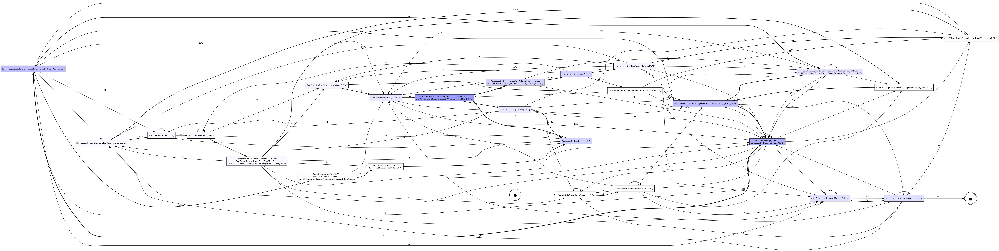

In [78]:
pm4py.view_dfg(dfg, start_activities, end_activities)

In [79]:
heuristics_net = pm4py.discover_heuristics_net(log_filtered.copy())

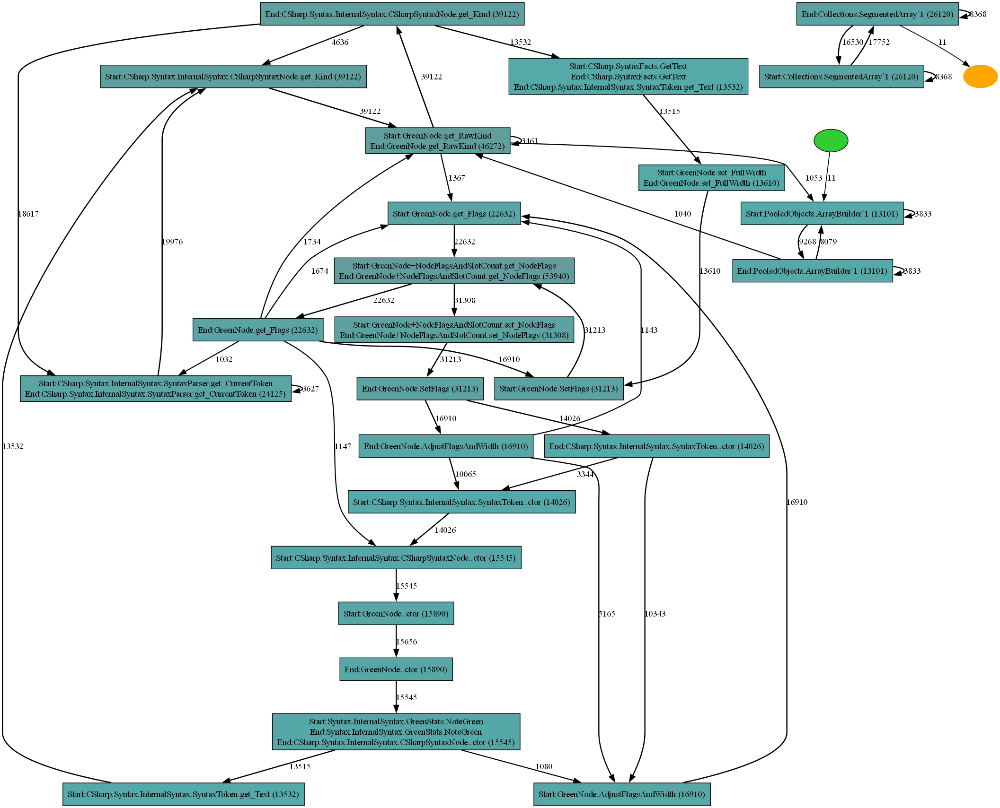

In [80]:
pm4py.view_heuristics_net(heuristics_net)

### 0.25% - 1%

In [82]:
value_counts_normalized = log['concept:name'].value_counts(normalize = True) * 100
values_above_threshold = value_counts_normalized[(value_counts_normalized >= 0.25) & (value_counts_normalized < 1)].index
log_filtered = log[log['concept:name'].isin(values_above_threshold)]
log_filtered["concept:name"].value_counts()

concept:name
Start:CSharp.Syntax.InternalSyntax.Lexer.get_CharProperties\nEnd:CSharp.Syntax.InternalSyntax.Lexer.get_CharProperties                                                                                                                12006
End:CSharp.Syntax.InternalSyntax.SyntaxToken+SyntaxTokenWithTrivia..ctor                                                                                                                                                              10266
Start:CSharp.Syntax.InternalSyntax.SyntaxToken+SyntaxTokenWithTrivia..ctor                                                                                                                                                            10266
Start:GreenNode+NodeFlagsAndSlotCount.get_SmallSlotCount\nEnd:GreenNode+NodeFlagsAndSlotCount.get_SmallSlotCount                                                                                                                      10179
End:GreenNode.get_SlotCount                

In [83]:
dfg, start_activities, end_activities = pm4py.discover_dfg(log_filtered.copy())

In [84]:
pm4py.view_dfg(dfg, start_activities, end_activities)

In [85]:
heuristics_net = pm4py.discover_heuristics_net(log_filtered.copy())

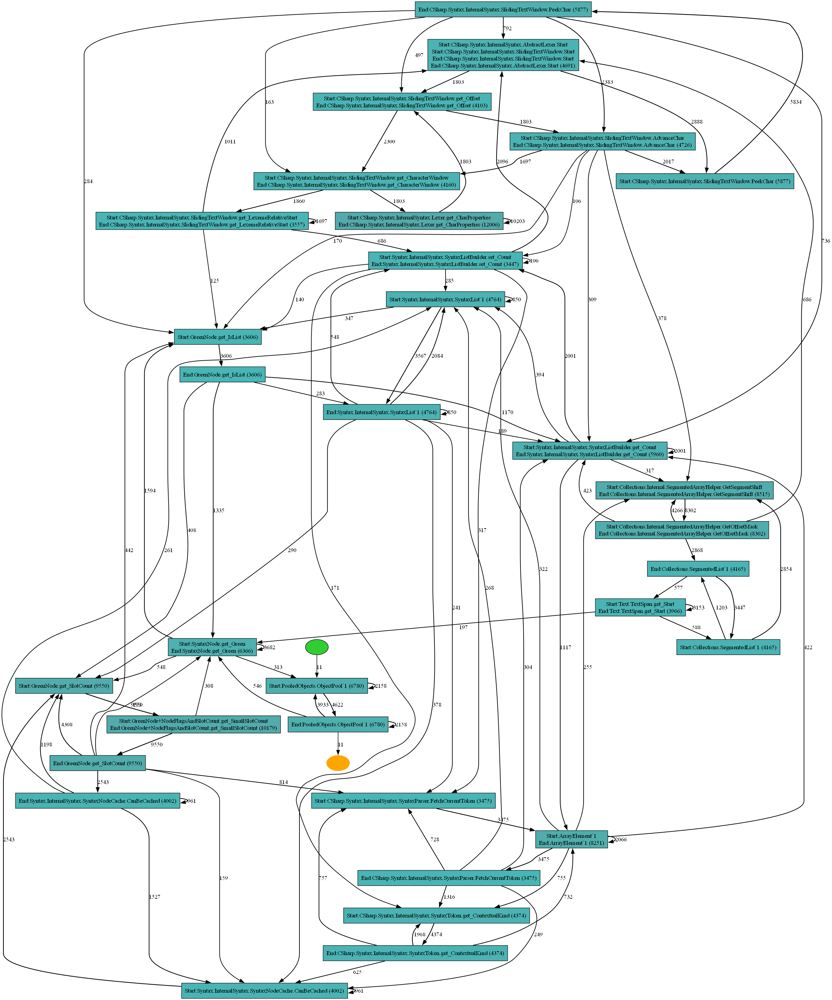

In [86]:
pm4py.view_heuristics_net(heuristics_net)

### 0.15%, 1 trace

In [93]:
log = pm4py.read_xes("after_regex.xes")

parsing log, completed traces ::   0%|          | 0/11 [00:00<?, ?it/s]

In [100]:
log_filtered = log[log["case:concept:name"] == '9']

value_counts_normalized = log_filtered['concept:name'].value_counts(normalize = True) * 100
values_above_threshold = value_counts_normalized[(value_counts_normalized >= 0.25)].index
log_filtered = log_filtered[log_filtered['concept:name'].isin(values_above_threshold)]
log_filtered["concept:name"].value_counts()

concept:name
Start:GreenNode+NodeFlagsAndSlotCount.get_NodeFlags                  4886
End:GreenNode+NodeFlagsAndSlotCount.get_NodeFlags                    4886
End:GreenNode.get_RawKind                                            3863
Start:GreenNode.get_RawKind                                          3863
End:CSharp.Syntax.InternalSyntax.CSharpSyntaxNode.get_Kind           3277
                                                                     ... 
Start:CSharp.Syntax.InternalSyntax.SlidingTextWindow.Start            501
End:CSharp.Syntax.InternalSyntax.AbstractLexer.Start                  501
End:CSharp.Syntax.InternalSyntax.SlidingTextWindow.Start              501
Start:CSharp.Syntax.InternalSyntax.SyntaxToken.get_ContextualKind     398
End:CSharp.Syntax.InternalSyntax.SyntaxToken.get_ContextualKind       398
Name: count, Length: 62, dtype: int64

In [102]:
dfg, start_activities, end_activities = pm4py.discover_dfg(log_filtered.copy())

In [103]:
pm4py.view_dfg(dfg, start_activities, end_activities)

In [104]:
heuristics_net = pm4py.discover_heuristics_net(log_filtered.copy())

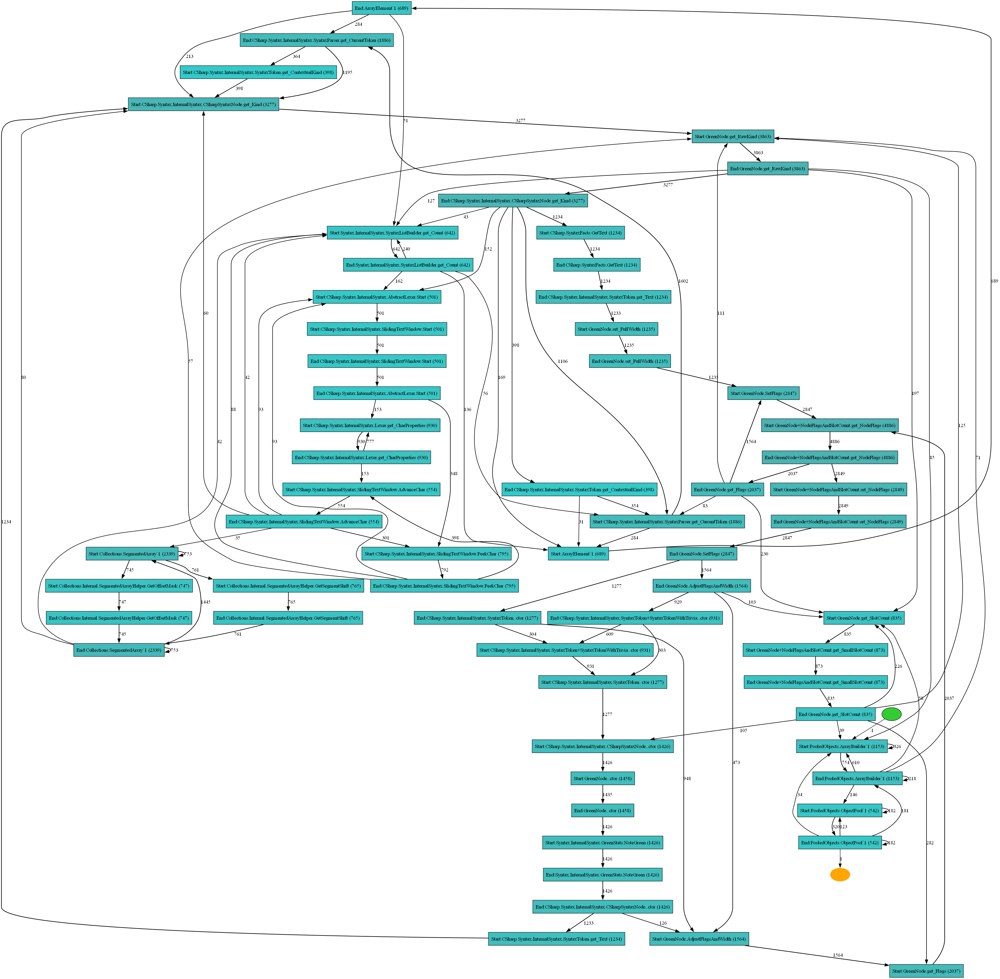

In [105]:
pm4py.view_heuristics_net(heuristics_net)